# Tomato Disease Classification using VGG16: A Multiclass Image Recognition Project


In [1]:
! pip install tensorflow numpy


# Import Library

In [2]:
import os
import numpy as np
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.applications import VGG16
from tensorflow.keras import layers
from tensorflow.keras import models
from tensorflow.keras import optimizers
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input
from tensorflow.keras.preprocessing.image import ImageDataGenerator, array_to_img




/opt/conda/lib/python3.10/site-packages/scipy/__init__.py:146: UserWarning: A NumPy version >=1.16.5 and <1.23.0 is required for this version of SciPy (detected version 1.24.3
  warnings.warn(f"A NumPy version >={np_minversion} and <{np_maxversion}"


# Load Train & Test

In [3]:
# Set the paths for training and testing data
base_path = '/kaggle/input/tomato-village/'
train_path_multiclass = os.path.join(base_path, 'Variant-a(Multiclass Classification)/train')
test_path_multiclass = os.path.join(base_path, 'Variant-a(Multiclass Classification)/test')



In [4]:
# Check the contents of the training directory
# print(os.listdir(train_path))

In [5]:
# Parameters
img_width, img_height = 224, 224
batch_size = 32
epochs = 50

In [6]:
# Image Data Generators for multiclass classification
train_datagen_multiclass = ImageDataGenerator(rescale=1.0/255,
                                              shear_range=0.2,
                                              zoom_range=0.2,
                                              horizontal_flip=True)

test_datagen_multiclass = ImageDataGenerator(rescale=1.0/255)

In [7]:
# Flow training images in batches of 32 using train_datagen generator
train_generator_multiclass = train_datagen_multiclass.flow_from_directory(train_path_multiclass,
                                                                          target_size=(img_width, img_height),
                                                                          batch_size=batch_size,
                                                                          class_mode='categorical',
                                                                          seed=42)

test_generator_multiclass = test_datagen_multiclass.flow_from_directory(test_path_multiclass,
                                                                        target_size=(img_width, img_height),
                                                                        batch_size=batch_size,
                                                                        class_mode='categorical',
                                                                        seed=42)


Found 3162 images belonging to 8 classes.
Found 461 images belonging to 8 classes.


# Load the pre-trained VGG16 model

In [8]:
from tensorflow.keras.applications import VGG16


In [9]:
from tensorflow.keras.applications import VGG16

# Set the input dimensions (img_width and img_height) according to your requirements
img_width, img_height = 224, 224

# Load the pre-trained VGG16 model from the uploaded file
weights_path = '/kaggle/input/vgg16-weights/vgg16_weights_tf_dim_ordering_tf_kernels_notop.h5'
base_model_multiclass = VGG16(weights=weights_path, include_top=False, input_shape=(img_width, img_height, 3))


In [10]:
# Freeze the layers
for layer in base_model_multiclass.layers:
    layer.trainable = False


In [11]:
# Create a custom model
model_multiclass = models.Sequential()

In [12]:
# Add the VGG16 base model
model_multiclass.add(base_model_multiclass)

In [13]:
# Add new layers
model_multiclass.add(layers.Flatten())
model_multiclass.add(layers.Dense(512, activation='relu'))
model_multiclass.add(layers.Dropout(0.5))
model_multiclass.add(layers.Dense(8, activation='softmax'))

In [14]:
# Compile the model
model_multiclass.compile(optimizer=optimizers.Adam(), loss='categorical_crossentropy', metrics=['accuracy'])


In [15]:
# Display the model summary
model_multiclass.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 vgg16 (Functional)          (None, 7, 7, 512)         14714688  
                                                                 
 flatten (Flatten)           (None, 25088)             0         
                                                                 
 dense (Dense)               (None, 512)               12845568  
                                                                 
 dropout (Dropout)           (None, 512)               0         
                                                                 
 dense_1 (Dense)             (None, 8)                 4104      
                                                                 
Total params: 27564360 (105.15 MB)
Trainable params: 12849672 (49.02 MB)
Non-trainable params: 14714688 (56.13 MB)
_________________________________________________________________


# Train the model

Epoch 1/50
98/98 [==============================] - 72s 604ms/step - loss: 2.4610 - accuracy: 0.3546 - val_loss: 1.4058 - val_accuracy: 0.4933
Epoch 2/50
98/98 [==============================] - 46s 467ms/step - loss: 1.5300 - accuracy: 0.4479 - val_loss: 1.2861 - val_accuracy: 0.5603
Epoch 3/50
98/98 [==============================] - 46s 473ms/step - loss: 1.4219 - accuracy: 0.4872 - val_loss: 1.2507 - val_accuracy: 0.5357
Epoch 4/50
98/98 [==============================] - 46s 468ms/step - loss: 1.3437 - accuracy: 0.5124 - val_loss: 1.0626 - val_accuracy: 0.6295
Epoch 5/50
98/98 [==============================] - 46s 466ms/step - loss: 1.2625 - accuracy: 0.5438 - val_loss: 1.1428 - val_accuracy: 0.5960
Epoch 6/50
98/98 [==============================] - 45s 463ms/step - loss: 1.2384 - accuracy: 0.5387 - val_loss: 1.0052 - val_accuracy: 0.6406
Epoch 7/50
98/98 [==============================] - 46s 467ms/step - loss: 1.1879 - accuracy: 0.5534 - val_loss: 1.0274 - val_accuracy: 0.6429

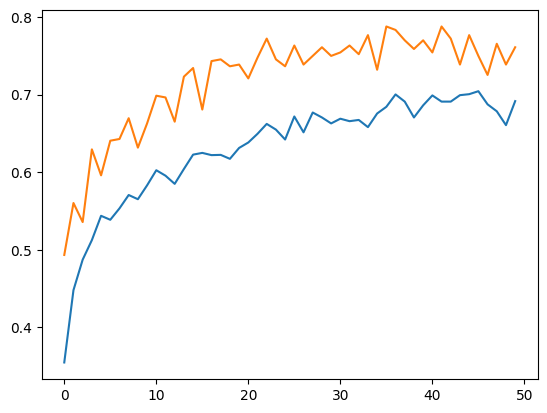

In [16]:
# Train the model for multiclass classification
history_multiclass = model_multiclass.fit(train_generator_multiclass,
                                          steps_per_epoch=train_generator_multiclass.samples // batch_size,
                                          epochs=epochs,
                                          validation_data=test_generator_multiclass,
                                          validation_steps=test_generator_multiclass.samples // batch_size)

# Plot training and validation accuracy for multiclass classification
plt.plot(history_multiclass.history['accuracy'], label='Training Accuracy (Multiclass)')
plt.plot(history_multiclass.history['val_accuracy'], label='Validation Accuracy (Multiclass)')



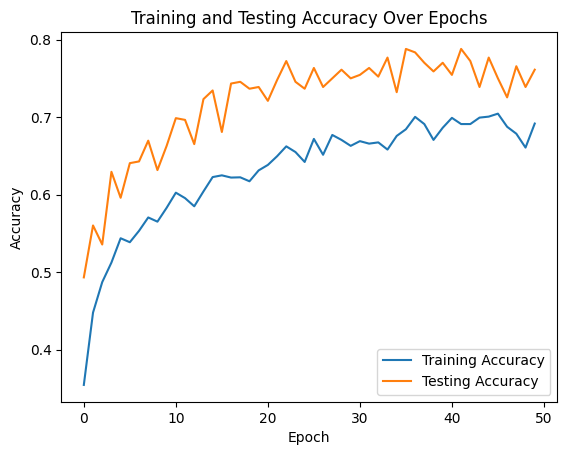

In [17]:

# Plot training and testing accuracy
plt.plot(history_multiclass.history['accuracy'], label='Training Accuracy')
plt.plot(history_multiclass.history['val_accuracy'], label='Testing Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Training and Testing Accuracy Over Epochs')
plt.legend()
plt.show()


Final Training Accuracy: 0.6917
15/15 [==============================] - 4s 272ms/step - loss: 0.6587 - accuracy: 0.7657
Final Testing Accuracy: 0.7657


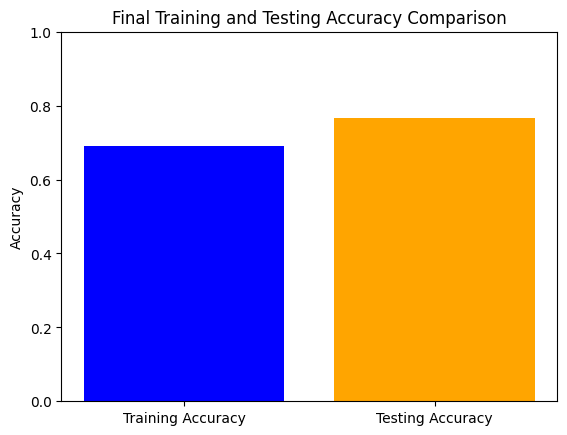

In [18]:
# Final training accuracy
final_train_accuracy = history_multiclass.history['accuracy'][-1]
print(f'Final Training Accuracy: {final_train_accuracy:.4f}')

# Final testing accuracy
final_test_loss, final_test_accuracy = model_multiclass.evaluate(test_generator_multiclass)
print(f'Final Testing Accuracy: {final_test_accuracy:.4f}')

# Bar chart for final training and testing accuracies
categories = ['Training Accuracy', 'Testing Accuracy']
accuracies = [final_train_accuracy, final_test_accuracy]

plt.bar(categories, accuracies, color=['blue', 'orange'])
plt.ylim(0, 1)  # Set the y-axis limit to represent accuracy percentage
plt.ylabel('Accuracy')
plt.title('Final Training and Testing Accuracy Comparison')
plt.show()


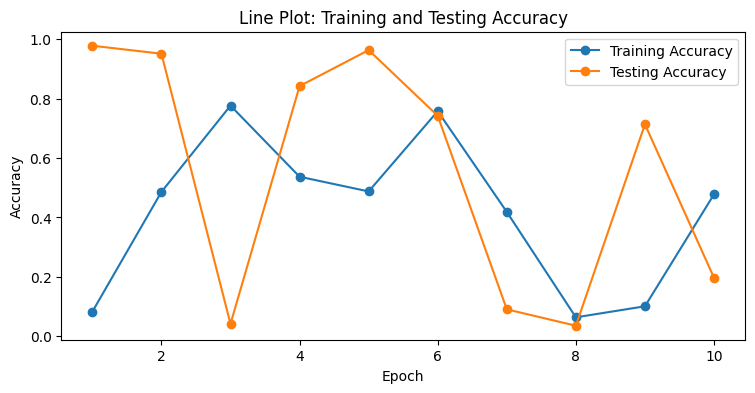

In [19]:
import matplotlib.pyplot as plt
import numpy as np

# Sample data
epochs = np.arange(1, 11)
training_accuracy = np.random.rand(10)
testing_accuracy = np.random.rand(10)

# Line plot for accuracy over epochs
plt.figure(figsize=(30, 4))
plt.subplot(1, 3, 1)
plt.plot(epochs, training_accuracy, label='Training Accuracy', marker='o')
plt.plot(epochs, testing_accuracy, label='Testing Accuracy', marker='o')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.title('Line Plot: Training and Testing Accuracy')
plt.legend()



# Testing With Single Image

In [20]:
import numpy as np
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input



1/1 [==============================] - 1s 819ms/step
Class Labels: {'Early_blight': 0, 'Healthy': 1, 'Late_blight': 2, 'Leaf Miner': 3, 'Magnesium Deficiency': 4, 'Nitrogen Deficiency': 5, 'Pottassium Deficiency': 6, 'Spotted Wilt Virus': 7}
Predicted Probabilities: [0. 0. 0. 1. 0. 0. 0. 0.]
Predicted class label: Leaf Miner


Text(0.5, 1.0, 'Leaf Miner')

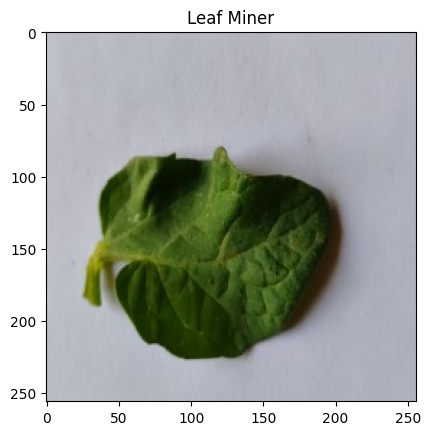

In [21]:
# Test the model on a single image
img_path = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/test/Healthy/IMG20220324112244.jpg'
img = load_img(img_path, target_size=(img_width, img_height))
img_array = img_to_array(img)
img_array = np.expand_dims(img_array, axis=0)
img_array = preprocess_input(img_array)
predictions =model_multiclass.predict(img_array)
class_labels = train_generator_multiclass .class_indices

# Print class labels and predicted probabilities
print("Class Labels:", class_labels)
print("Predicted Probabilities:", predictions[0])

# Decode the predicted class index
predicted_class_index = np.argmax(predictions[0])
predicted_class_label = list(class_labels.keys())[predicted_class_index]
ay= print("Predicted class label:", predicted_class_label)

plt.imshow(plt.imread(img_path ))
plt.title( predicted_class_label)

# Testing With 10 Random Images From All class

In [22]:
import numpy as np
import pandas as pd
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import os
import random
from tensorflow.keras.preprocessing.image import array_to_img
from tensorflow.keras.preprocessing.image import load_img, img_to_array
from tensorflow.keras.applications.vgg16 import preprocess_input

1/1 [==============================] - 0s 19ms/step


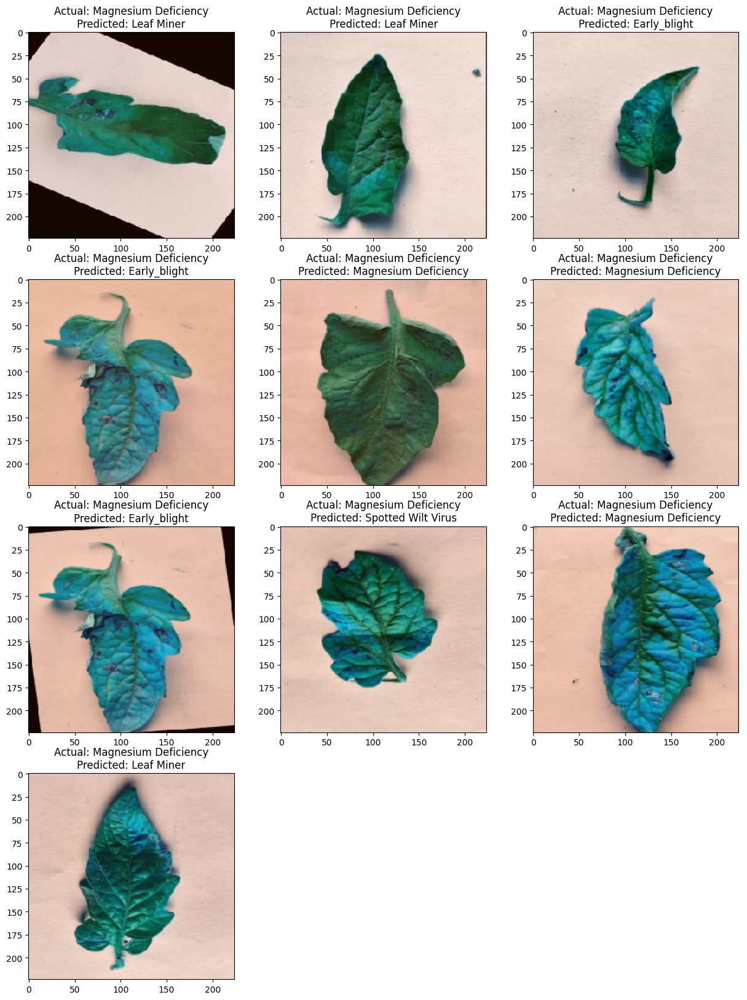

1/1 [==============================] - 0s 20ms/step


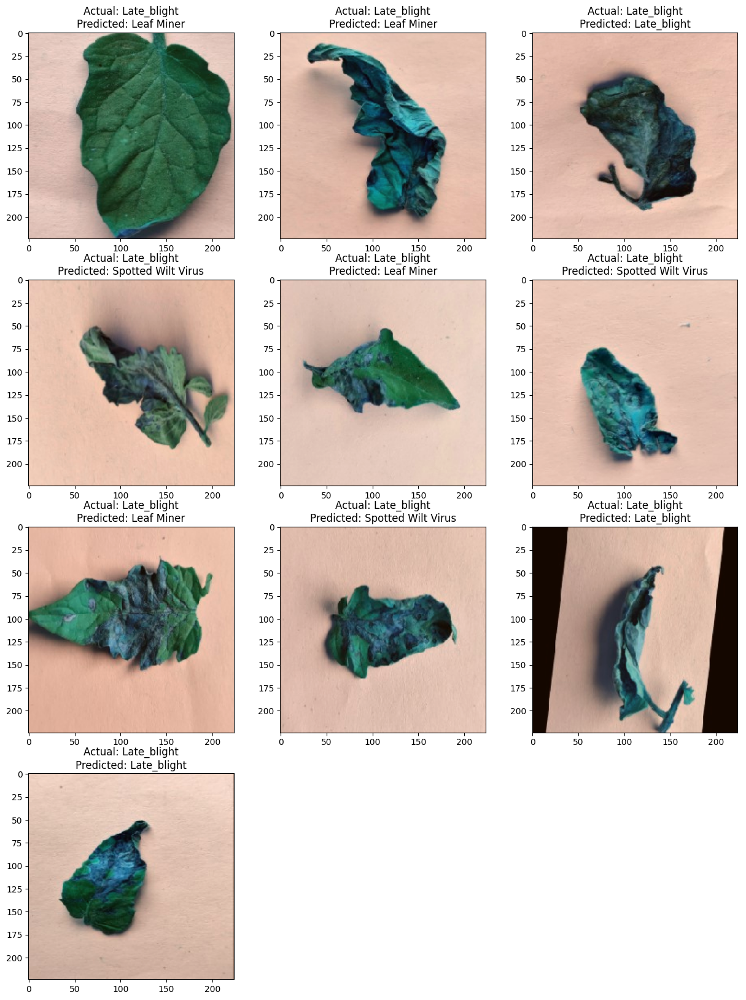

1/1 [==============================] - 0s 22ms/step


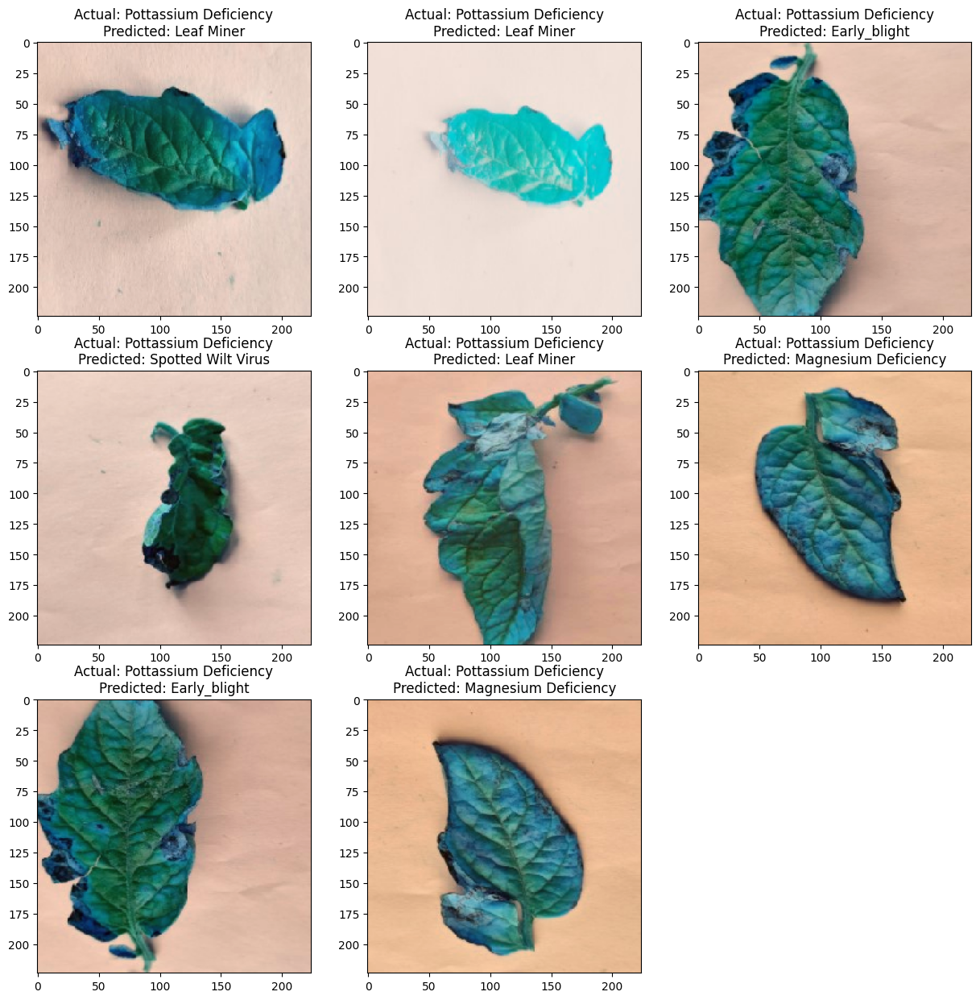

1/1 [==============================] - 0s 19ms/step


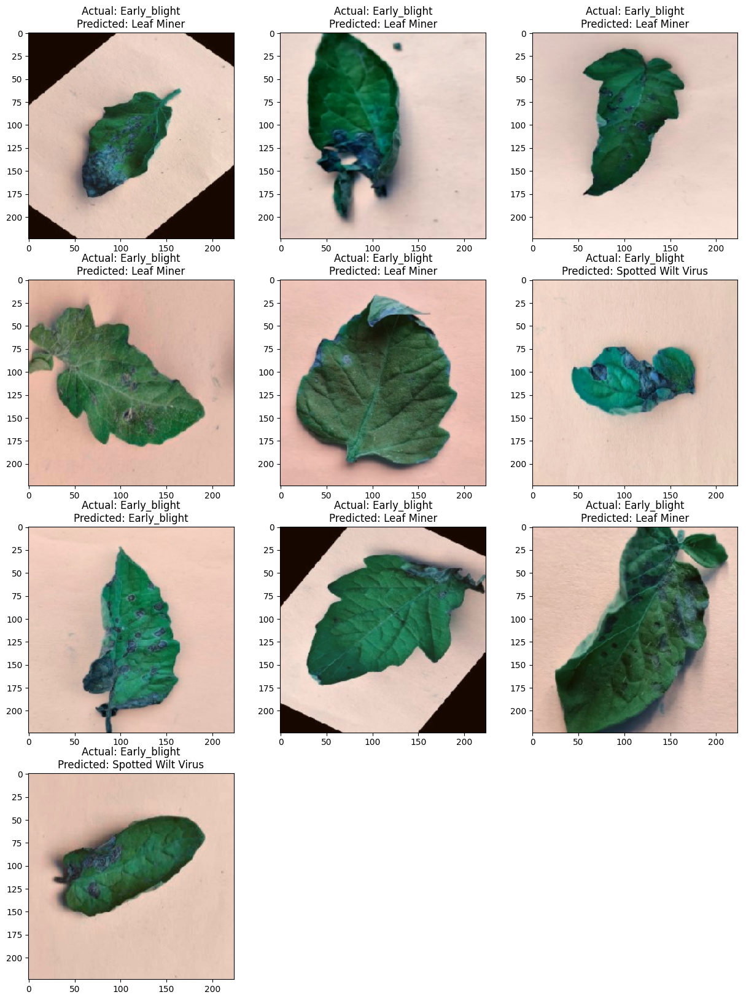

1/1 [==============================] - 0s 19ms/step


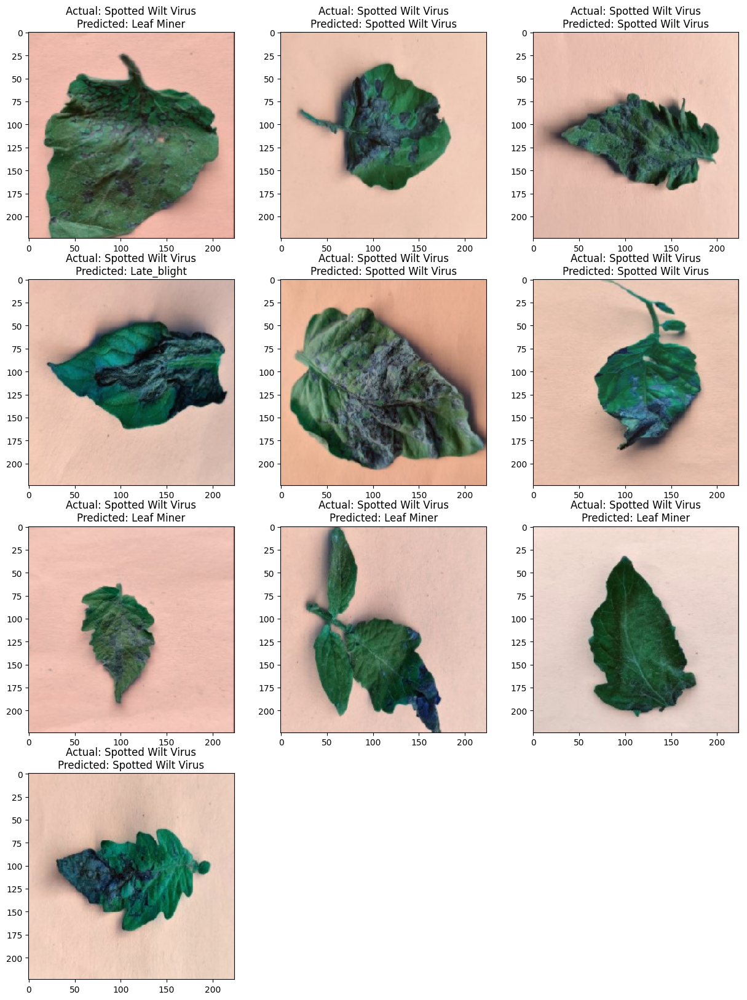

1/1 [==============================] - 0s 20ms/step


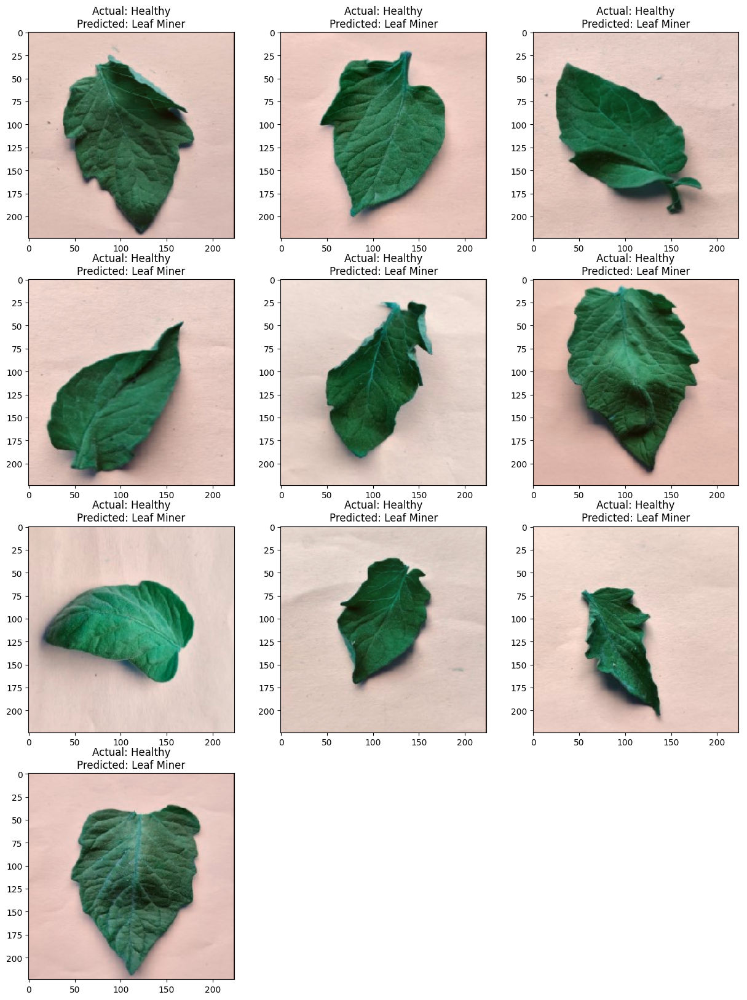

1/1 [==============================] - 0s 20ms/step


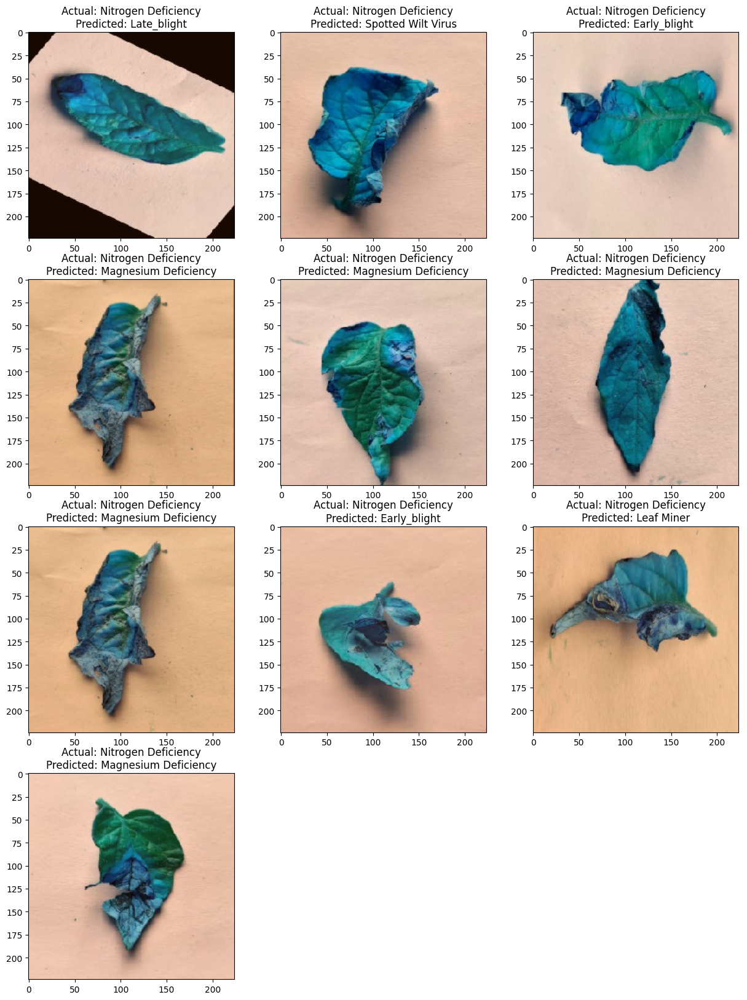

1/1 [==============================] - 0s 20ms/step


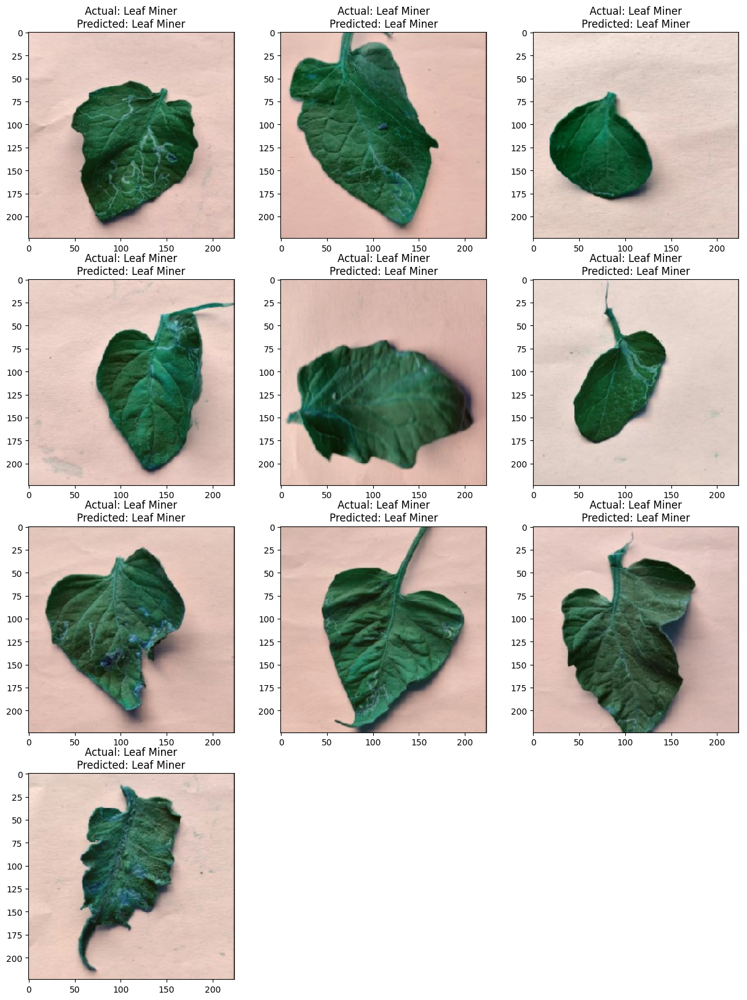

In [23]:
# Set the test path
test_path = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/test'

# List all class folders in the test path
class_folders = os.listdir(test_path)

# Iterate through 10 random images from each class
for class_folder in class_folders:
    class_path = os.path.join(test_path, class_folder)
    if os.path.isdir(class_path):
        # List all image files in the class folder
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Select 10 random images if there are more than 10
        selected_images = random.sample(images, min(10, len(images)))

        # Create subplots with 3 images in each row
        num_rows = len(selected_images) // 3 + (len(selected_images) % 3 > 0)
        fig, axs = plt.subplots(num_rows, 3, figsize=(15, 5 * num_rows))

        # Make predictions for each selected image
        for i, image_name in enumerate(selected_images):
            img_path = os.path.join(class_path, image_name)
            img = load_img(img_path, target_size=(img_width, img_height))
            img_array = img_to_array(img)
            img_array = np.expand_dims(img_array, axis=0)
            img_array = preprocess_input(img_array)
            predictions = model_multiclass.predict(img_array)

            # Decode the predicted class index
            predicted_class_index = np.argmax(predictions[0])
            predicted_class_label = list(class_labels.keys())[predicted_class_index]

            # Display the image along with predicted and actual classes
            row = i // 3
            col = i % 3
            axs[row, col].imshow(array_to_img(img_array[0]))
            axs[row, col].set_title("Actual: {}\nPredicted: {}".format(class_folder, predicted_class_label))

        # Hide empty subplots
        for i in range(len(selected_images), num_rows * 3):
            row = i // 3
            col = i % 3
            axs[row, col].axis('off')

        plt.show()


# Testing With Random 16 Images From Any Class

1/1 [==============================] - 0s 19ms/step


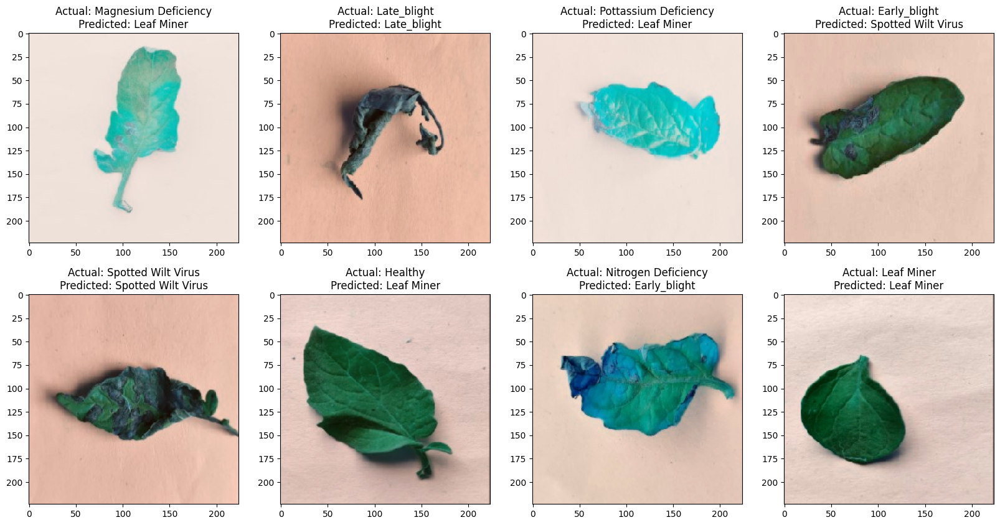

1/1 [==============================] - 0s 22ms/step


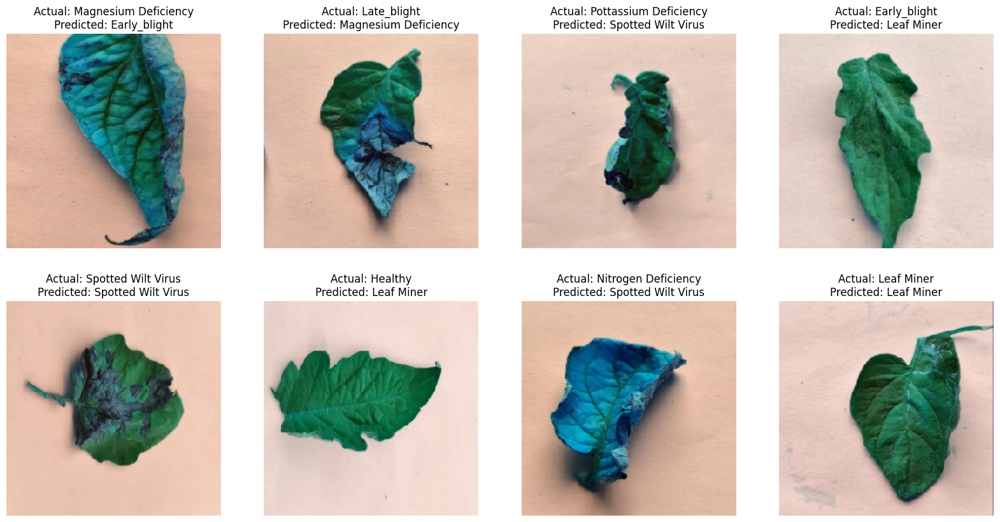

In [24]:
import os
import random
import matplotlib.pyplot as plt
from tensorflow.keras.preprocessing.image import load_img, img_to_array, array_to_img

# Set the test path
test_path = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/test'

# List all class folders in the test path
class_folders = os.listdir(test_path)

# Select 12 random images from different classes
selected_images = []
for class_folder in class_folders:
    class_path = os.path.join(test_path, class_folder)
    if os.path.isdir(class_path):
        # List all image files in the class folder
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]

        # Select one random image if there are any
        if images:
            selected_image = random.choice(images)
            selected_images.append((class_folder, selected_image))

# Create subplots with 3 images in each row
num_rows = len(selected_images) // 4 + (len(selected_images) % 4 > 0)
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))

# Make predictions for each selected image
for i, (class_folder, image_name) in enumerate(selected_images):
    img_path = os.path.join(test_path, class_folder, image_name)
    img = load_img(img_path, target_size=(img_width, img_height))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    predictions = model_multiclass.predict(img_array)

    # Decode the predicted class index
    predicted_class_index = np.argmax(predictions[0])
    predicted_class_label = list(class_labels.keys())[predicted_class_index]

    # Display the image along with predicted and actual classes
    row = i // 4
    col = i % 4
    axs[row, col].imshow(array_to_img(img_array[0]))
    axs[row, col].set_title("Actual: {}\nPredicted: {}".format(class_folder, predicted_class_label))

# Hide empty subplots
for i in range(len(selected_images), num_rows * 4):
    row = i // 4
    col = i % 4
    axs[row, col].axis('off')

plt.show()
# Set the test path
test_path = '/kaggle/input/tomato-village/Variant-a(Multiclass Classification)/test'

# List all class folders in the test path
class_folders = os.listdir(test_path)

# Select one random image from each class
selected_images = []

for class_folder in class_folders:
    class_path = os.path.join(test_path, class_folder)
    if os.path.isdir(class_path):
        # List all image files in the class folder
        images = [f for f in os.listdir(class_path) if f.lower().endswith(('.png', '.jpg', '.jpeg'))]
        
        # Select one random image if there are any
        if images:
            selected_image = random.choice(images)
            selected_images.append((class_folder, selected_image))

# Create subplots with 4 images in each row
num_rows = len(selected_images) // 4 + (len(selected_images) % 4 > 0)
fig, axs = plt.subplots(num_rows, 4, figsize=(20, 5 * num_rows))

# Make predictions for each selected image
for i, (class_folder, image_name) in enumerate(selected_images):
    img_path = os.path.join(test_path, class_folder, image_name)
    img = load_img(img_path, target_size=(img_width, img_height))
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)
    img_array = preprocess_input(img_array)
    predictions = model_multiclass.predict(img_array)

    # Decode the predicted class index
    predicted_class_index = np.argmax(predictions[0])
    predicted_class_label = list(class_labels.keys())[predicted_class_index]

    # Display the image along with predicted and actual classes
    row = i // 4
    col = i % 4
    axs[row, col].imshow(array_to_img(img_array[0]))
    axs[row, col].set_title("Actual: {}\nPredicted: {}".format(class_folder, predicted_class_label))
    axs[row, col].axis('off')

plt.show()


# Segmentation VGG-16

In [25]:
import numpy as np
import pandas as pd
import tensorflow as tf

import keras.backend as K
from sklearn.model_selection import train_test_split
import matplotlib.pyplot as plt
import os